#### Imports

In [1]:
# Model Imports
from transformers import RTDetrV2ForObjectDetection, RTDetrImageProcessor

# Additional Imports

import os
import json
import torch
from pathlib import Path
from zoneinfo import ZoneInfo
from datetime import datetime 
from datasets import Dataset, DatasetDict
from PIL import Image
import albumentations as A
from torch.utils.data import Dataset



/opt/venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


#### Path Configurations

In [2]:
# Path Configuration
current_working_directory = Path.cwd()
base_project_directory = current_working_directory.parent.parent.parent

# Base Model and Project Path Configuration
base_model_name = "PekingU/rtdetr_v2_r101vd"
current_date = datetime.now(ZoneInfo("Europe/Berlin")).strftime("%d-%m-%Y_%H-%M")
project_name = f"{current_date}_{base_model_name.split('/')[-1]}"

# Dataset Path Configuration
data_directory = current_working_directory.parent.parent.parent / "data" / "detection"
dataset_name = "coco_football_players_detection_v11"
full_dataset_path = os.path.join(data_directory, dataset_name)

# Tuned Model Path Configuration
model_directory = current_working_directory.parent.parent.parent / "models" / "detection"
full_model_output_path = os.path.join(model_directory, project_name)
#checkpoint_path = '/home/tom/Desktop/Programming/Personal/live-footie-formations/models/detection/28-04-2026_09-21_rtdetr_v2/checkpoint-3150'
os.makedirs(full_model_output_path, exist_ok=True)

#### Dataset Setup

In [3]:
from datasets import Dataset, DatasetDict
import json
from pathlib import Path


def load_coco_split(split_dir: str) -> Dataset:
    split_path = Path(split_dir)
    annotation_file = split_path / "_annotations.coco.json"

    with open(annotation_file) as f:
        coco_data = json.load(f)

    id_to_annotations = {}
    for ann in coco_data["annotations"]:
        id_to_annotations.setdefault(ann["image_id"], []).append(ann)

    records = []
    for image_info in coco_data["images"]:
        records.append({
            "image_id":    image_info["id"],
            "image_path":   str(split_path / image_info["file_name"]),
            "width":       image_info["width"],
            "height":      image_info["height"],
            "annotations": id_to_annotations.get(image_info["id"], []),
        })

    return Dataset.from_list(records)


def load_coco_dataset(root_dir: str) -> DatasetDict:
    """
    Expects structure:
      root_dir/
        train/
          _annotations.coco.json
          image1.jpg
          ...
        valid/          # or val/
          _annotations.coco.json
          ...
        test/           # optional
          _annotations.coco.json
          ...
    """
    root_path = Path(root_dir)

    # Map canonical HuggingFace split names to possible folder names
    split_dir_candidates = {
        "train":      ["train"],
        "validation": ["valid", "val", "validation"],
        "test":       ["test"],
    }

    splits = {}
    for split_name, candidates in split_dir_candidates.items():
        for candidate in candidates:
            split_dir = root_path / candidate
            if (split_dir / "_annotations.coco.json").exists():
                splits[split_name] = load_coco_split(str(split_dir))
                break

    return DatasetDict(splits)

In [4]:
# Load it
dataset = load_coco_dataset(full_dataset_path)

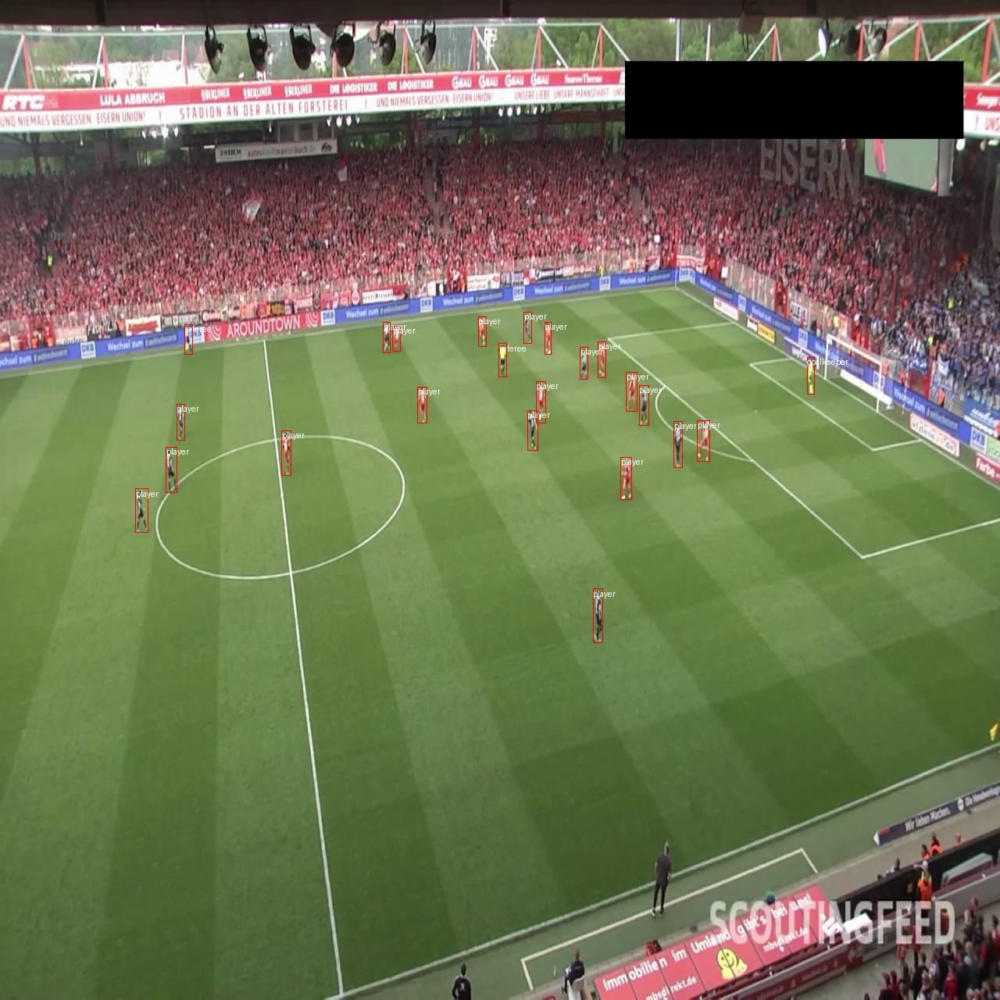

In [5]:
import numpy as np
from PIL import Image, ImageDraw

# Get mapping from category id to category name
categories = ['ball', 'goalkeeper', 'player', 'referee']
id2label = {index: x for index, x in enumerate(categories, start=0)}
label2id = {v: k for k, v in id2label.items()}

# Load image and annotations
image = Image.open(dataset["train"][2]["image_path"])
annotations = dataset["train"][2]["annotations"]

# Draw bounding boxes and labels
draw = ImageDraw.Draw(image)
for i in range(len(annotations)):
    box = annotations[i]["bbox"]
    class_idx = annotations[i]["category_id"]
    x, y, w, h = tuple(box)
    draw.rectangle((x, y, x + w, y + h), outline="red", width=1)
    draw.text((x, y), id2label[class_idx], fill="white")

image

#### Preprocessor and Model Setup

In [6]:
# Image Processor
image_processor = RTDetrImageProcessor.from_pretrained(
    base_model_name,
    do_resize=True,
    size={"width": 1280, "height": 1280},
    use_Fast=True,
)

# Detection Model
detection_model = RTDetrV2ForObjectDetection.from_pretrained(
    base_model_name,
    num_labels=len(categories),
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True,  # needed when num_labels differs from the checkpoint    
) # Can additionally load from a saved point

[transformers] You passed `num_labels=4` which is incompatible to the `id2label` map of length `80`.
Loading weights: 100%|██████████| 1025/1025 [00:00<00:00, 3819.70it/s]
[transformers] RTDetrV2ForObjectDetection LOAD REPORT from: PekingU/rtdetr_v2_r101vd
Key                                                 | Status   |                                                                                        
----------------------------------------------------+----------+----------------------------------------------------------------------------------------
model.decoder.class_embed.{0, 1, 2, 3, 4, 5}.bias   | MISMATCH | Reinit due to size mismatch - ckpt: torch.Size([80]) vs model:torch.Size([4])          
model.enc_score_head.weight                         | MISMATCH | Reinit due to size mismatch - ckpt: torch.Size([80, 256]) vs model:torch.Size([4, 256])
model.decoder.class_embed.{0, 1, 2, 3, 4, 5}.weight | MISMATCH | Reinit due to size mismatch - ckpt: torch.Size([80, 256]) vs model

#### Dataset Augmentations

In [7]:
train_augmentation_and_transform = A.Compose(
    [
        # Scale (zoom in/out by up to 50%)
        A.RandomResizedCrop(
            size=(1280, 1280),
            scale=(0.5, 1.0),
            p=1.0
        ),
        # Translate (shift image by up to 10%)
        A.ShiftScaleRotate(
            shift_limit=0.1,
            scale_limit=0.0,
            rotate_limit=5.0,
            border_mode=0,
            p=0.5
        ),
        # Flips
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.0),
        # HSV color augmentation
        A.HueSaturationValue(
            hue_shift_limit=int(0.015 * 180),
            sat_shift_limit=int(0.7 * 255),
            val_shift_limit=int(0.4 * 255),
            p=1.0
        ),
        # RandAugment equivalent
        A.SomeOf(
            [
                A.Equalize(p=1.0),
                A.Sharpen(p=1.0),
                A.RandomBrightnessContrast(p=1.0),
                A.Posterize(p=1.0),
                A.CLAHE(p=1.0),
                A.ColorJitter(p=1.0),
                A.Solarize(p=1.0),
            ],
            n=2,
            p=0.5,
        ),
    ],
    bbox_params=A.BboxParams(
        format="coco",
        label_fields=["category_id"],
        clip=True,
        min_area=25,
        min_width=1,
        min_height=1
    ),
)

validation_transform = A.Compose(
    [A.NoOp()],
    bbox_params=A.BboxParams(
        format="coco",
        label_fields=["category_id"],
        clip=True,
        min_area=1,
        min_width=1,
        min_height=1
    ),
)

/opt/venv/lib/python3.12/site-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


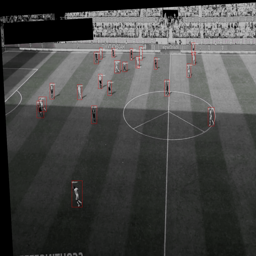

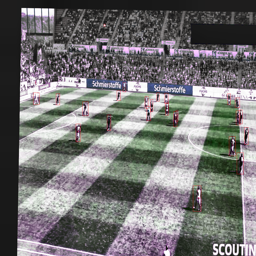

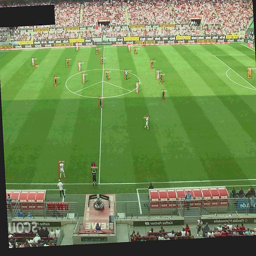

In [8]:
for i in [15, 16, 17]:
    image = Image.open(dataset["train"][i]["image_path"])
    annotations = dataset["train"][i]["annotations"]

    # Apply the augmentation
    output = train_augmentation_and_transform(
        image=np.array(image),
        bboxes=[ann["bbox"] for ann in annotations],
        category_id=[ann["category_id"] for ann in annotations],
    )

    # Unpack the output
    image = Image.fromarray(output["image"])
    categories, boxes = output["category_id"], output["bboxes"]

    # Draw the augmented image
    draw = ImageDraw.Draw(image)
    for category, box in zip(categories, boxes):
        x, y, w, h = box
        draw.rectangle((x, y, x + w, y + h), outline="red", width=1)
        draw.text((x, y), id2label[category], fill="white")

    display(image.resize([256, 256]))

In [9]:
from torch.utils.data import Dataset

class FootballPlayerDataset(Dataset):
    def __init__(self, dataset, image_processor, transform=None):
        self.dataset = dataset
        self.image_processor = image_processor
        self.transform = transform

    @staticmethod
    def format_image_annotations_as_coco(image_id, categories, boxes):
        annotations = []
        for category, bbox in zip(categories, boxes):
            formatted_annotation = {
                "image_id": image_id,
                "category_id": category,
                "bbox": list(bbox),
                "iscrowd": 0,
                "area": bbox[2] * bbox[3],
            }
            annotations.append(formatted_annotation)

        return {
            "image_id": image_id,
            "annotations": annotations,
        }

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        sample = self.dataset[idx]

        image_id = sample["image_id"]
        image = Image.open(sample["image_path"]).convert("RGB")
        annotations = sample["annotations"]

        boxes = [ann["bbox"] for ann in annotations]
        categories = [ann["category_id"] for ann in annotations]

        image = np.array(image)

        if self.transform:
            transformed = self.transform(image=image, bboxes=boxes, category_id=categories)
            image = transformed["image"]
            boxes = transformed["bboxes"]
            categories = transformed["category_id"]

        formatted_annotations = self.format_image_annotations_as_coco(image_id, categories, boxes)

        result = self.image_processor(
            images=image, annotations=formatted_annotations, return_tensors="pt"
        )

        result = {k: v[0] for k, v in result.items()}

        # Always ensure orig_size is a 2-element array [height, width]
        h, w = image.shape[:2]
        result["orig_size"] = torch.tensor([h, w])

        return result

In [10]:
train_dataset = FootballPlayerDataset(dataset["train"], image_processor, transform=train_augmentation_and_transform)
validation_dataset = FootballPlayerDataset(dataset["validation"], image_processor, transform=validation_transform)
test_dataset = FootballPlayerDataset(dataset["test"], image_processor, transform=validation_transform)

train_dataset[15]

{'pixel_values': tensor([[[0.9412, 0.9529, 0.9725,  ..., 0.7608, 0.6784, 0.6510],
          [0.9529, 0.9608, 0.9765,  ..., 0.7725, 0.6941, 0.6902],
          [0.9529, 0.9647, 0.9765,  ..., 0.7725, 0.7059, 0.7098],
          ...,
          [0.2902, 0.2824, 0.2824,  ..., 0.6588, 0.6627, 0.6588],
          [0.2902, 0.2902, 0.2824,  ..., 0.6471, 0.6471, 0.6471],
          [0.2863, 0.2824, 0.2824,  ..., 0.6196, 0.6196, 0.6118]],
 
         [[1.0000, 1.0000, 1.0000,  ..., 0.6980, 0.6235, 0.5882],
          [1.0000, 1.0000, 1.0000,  ..., 0.7216, 0.6510, 0.6392],
          [1.0000, 1.0000, 1.0000,  ..., 0.7451, 0.6784, 0.6706],
          ...,
          [0.5647, 0.5608, 0.5569,  ..., 0.8784, 0.8784, 0.8706],
          [0.5647, 0.5608, 0.5569,  ..., 0.8588, 0.8549, 0.8392],
          [0.5608, 0.5569, 0.5569,  ..., 0.8314, 0.8196, 0.8000]],
 
         [[0.8549, 0.8745, 0.8863,  ..., 0.7098, 0.6392, 0.6196],
          [0.8667, 0.8784, 0.8902,  ..., 0.7294, 0.6627, 0.6627],
          [0.8745, 0.886

Image tensor shape: torch.Size([3, 1280, 1280])
Boxes shape: (19, 4)
Categories shape: (19,)


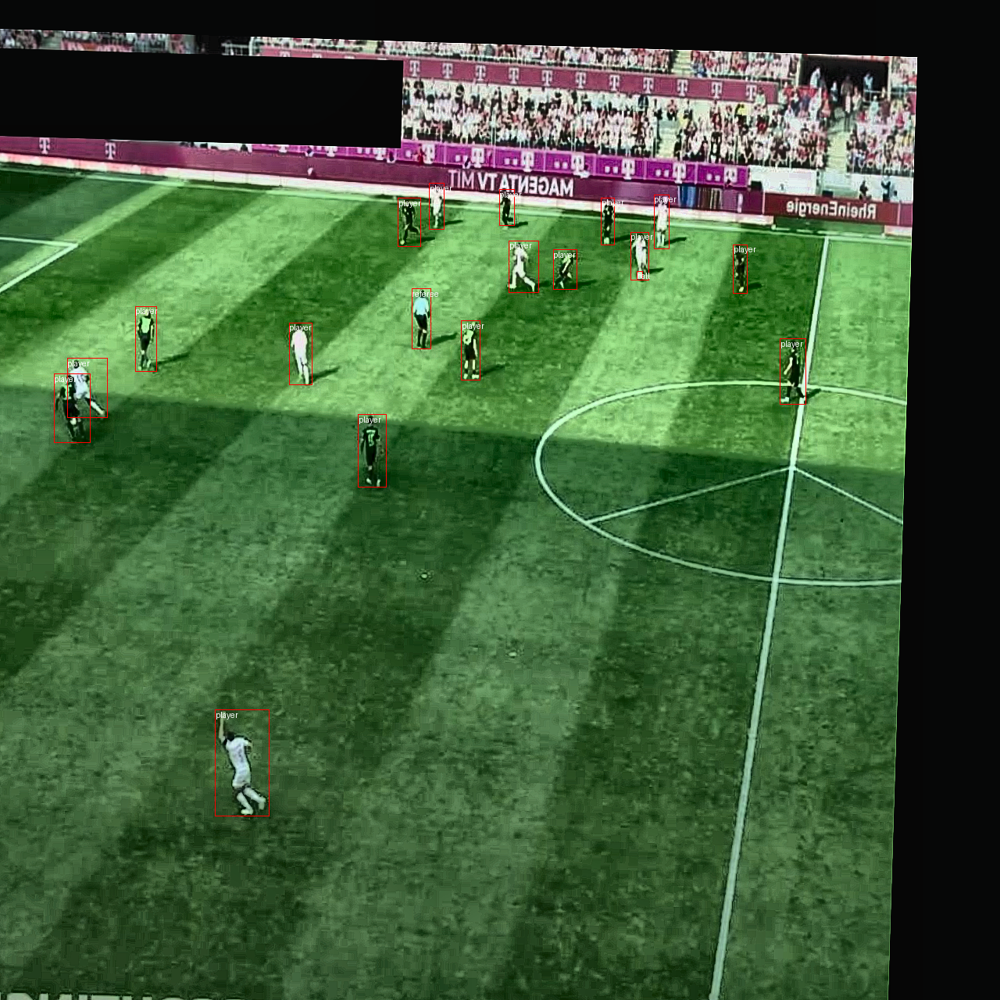

Image tensor shape: torch.Size([3, 1280, 1280])
Boxes shape: (23, 4)
Categories shape: (23,)


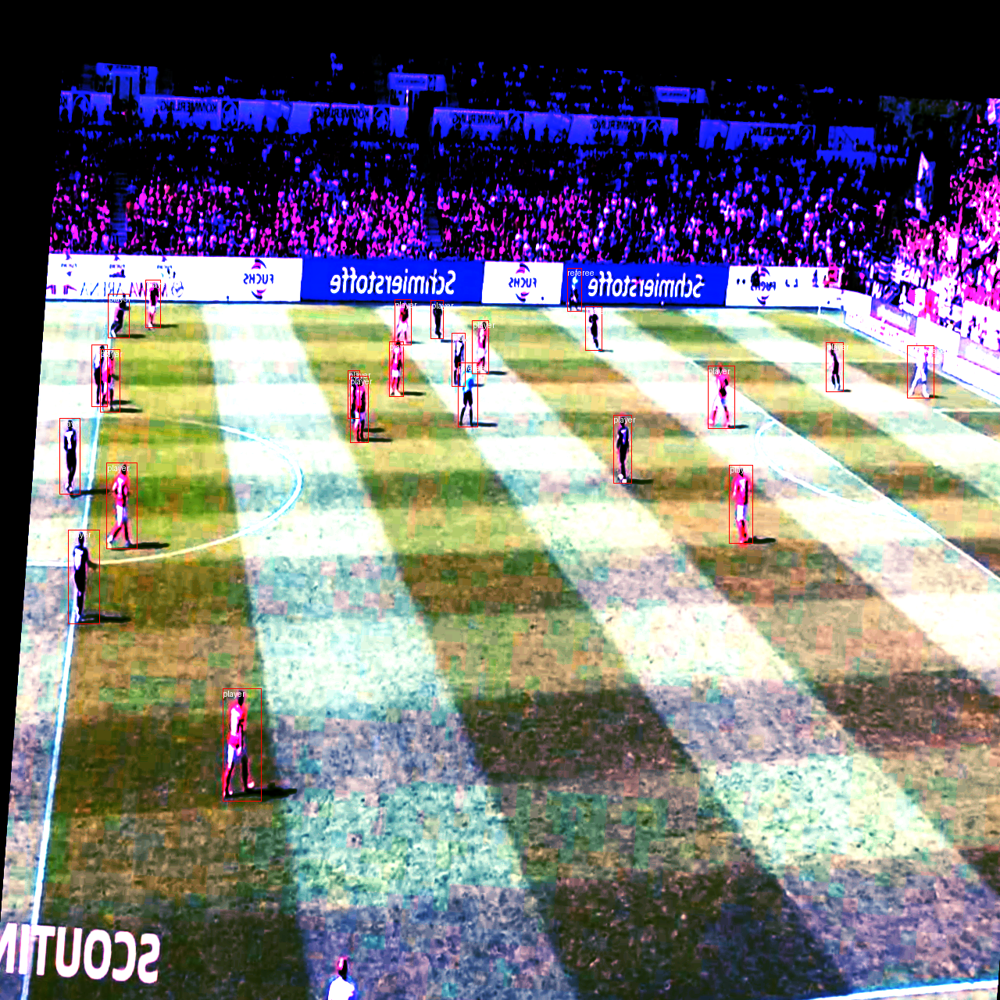

Image tensor shape: torch.Size([3, 1280, 1280])
Boxes shape: (24, 4)
Categories shape: (24,)


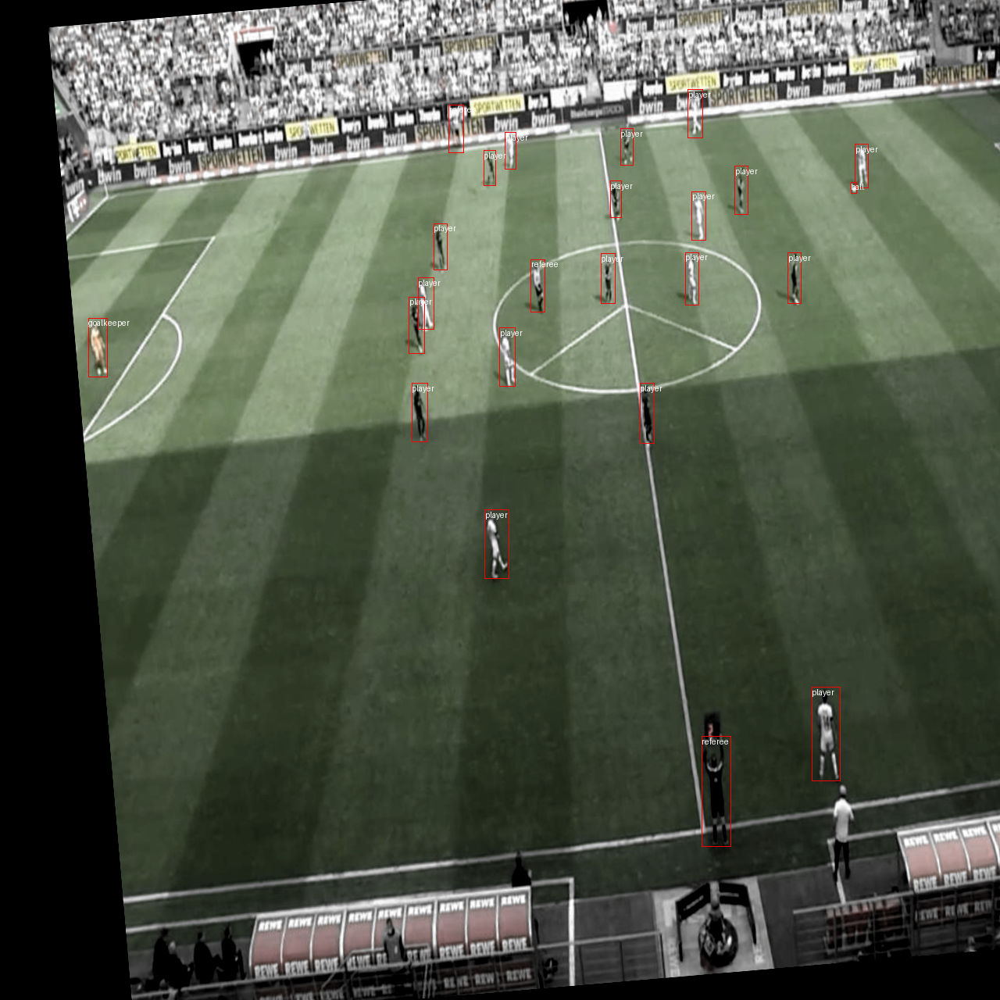

In [11]:
for i in [15, 16, 17]:
    sample = train_dataset[i]

    # De-normalize image
    image = sample["pixel_values"]
    print("Image tensor shape:", image.shape)
    image = image.numpy().transpose(1, 2, 0)
    image = (image - image.min()) / (image.max() - image.min()) * 255.
    image = Image.fromarray(image.astype(np.uint8))

    # Convert boxes from [center_x, center_y, width, height] to [x, y, width, height] for visualization
    boxes = sample["labels"]["boxes"].numpy()
    print("Boxes shape:", boxes.shape)
    boxes[:, :2] = boxes[:, :2] - boxes[:, 2:] / 2
    w, h = image.size
    boxes = boxes * np.array([w, h, w, h])[None]

    categories = sample["labels"]["class_labels"].numpy()
    print("Categories shape:", categories.shape)

    # Draw boxes and labels on image
    draw = ImageDraw.Draw(image)
    for box, category in zip(boxes, categories):
        x, y, w, h = box
        draw.rectangle([x, y, x + w, y + h], outline="red", width=1)
        draw.text((x, y), id2label[category], fill="white")

    display(image)

In [12]:
import torch

def collate_fn(batch):
    data = {}
    data["pixel_values"] = torch.stack([x["pixel_values"] for x in batch])
    data["labels"] = [x["labels"] for x in batch]
    return data

In [13]:
import numpy as np
from dataclasses import dataclass
from transformers.image_transforms import center_to_corners_format
from torchmetrics.detection.mean_ap import MeanAveragePrecision


@dataclass
class ModelOutput:
    logits: torch.Tensor
    pred_boxes: torch.Tensor


class MAPEvaluator:

    def __init__(self, image_processor, threshold=0.00, id2label=None):
        self.image_processor = image_processor
        self.threshold = threshold
        self.id2label = id2label

    def collect_image_sizes(self, targets):
        image_sizes = []
        for batch in targets:
            batch_image_sizes = []
            for x in batch:
                size = np.array(x["orig_size"]).flatten()  # flatten to guarantee 1D
                if size.shape[0] == 1:
                    size = np.array([size[0], size[0]])  # square image fallback
                batch_image_sizes.append(size)
            image_sizes.append(torch.tensor(np.array(batch_image_sizes)))
        return image_sizes

    def collect_targets(self, targets, image_sizes):
        post_processed_targets = []
        for target_batch, image_size_batch in zip(targets, image_sizes):
            for target, size in zip(target_batch, image_size_batch):
                # here we have "yolo" format (x_center, y_center, width, height) in relative coordinates 0..1
                # and we need to convert it to "pascal" format (x_min, y_min, x_max, y_max) in absolute coordinates
                height, width = size
                boxes = torch.tensor(target["boxes"])
                boxes = center_to_corners_format(boxes)
                boxes = boxes * torch.tensor([[width, height, width, height]])

                labels = torch.tensor(target["class_labels"])
                post_processed_targets.append({"boxes": boxes, "labels": labels})
        return post_processed_targets

    def collect_predictions(self, predictions, image_sizes):
        post_processed_predictions = []
        for batch, target_sizes in zip(predictions, image_sizes):
            batch_logits, batch_boxes = batch[1], batch[2]
            output = ModelOutput(logits=torch.tensor(batch_logits), pred_boxes=torch.tensor(batch_boxes))
            post_processed_output = self.image_processor.post_process_object_detection(
                output, threshold=self.threshold, target_sizes=target_sizes
            )
            post_processed_predictions.extend(post_processed_output)
        return post_processed_predictions

    @torch.no_grad()
    def __call__(self, evaluation_results):
        predictions, targets = evaluation_results.predictions, evaluation_results.label_ids

        image_sizes = self.collect_image_sizes(targets)
        post_processed_targets = self.collect_targets(targets, image_sizes)
        post_processed_predictions = self.collect_predictions(predictions, image_sizes)

        evaluator = MeanAveragePrecision(box_format="xyxy", class_metrics=True)
        evaluator.warn_on_many_detections = False
        evaluator.update(post_processed_predictions, post_processed_targets)

        metrics = evaluator.compute()

        classes = metrics.pop("classes")
        map_per_class = metrics.pop("map_per_class")
        mar_100_per_class = metrics.pop("mar_100_per_class")

        for class_id, class_map, class_mar in zip(classes, map_per_class, mar_100_per_class):
            class_name = self.id2label[class_id.item()] if self.id2label is not None else class_id.item()
            metrics[f"map_{class_name}"] = class_map
            metrics[f"mar_100_{class_name}"] = class_mar

        metrics = {k: round(v.item(), 4) for k, v in metrics.items()}
        return metrics

eval_compute_metrics_fn = MAPEvaluator(image_processor=image_processor, threshold=0.01, id2label=id2label)

In [14]:
import csv
import time
from transformers import TrainerCallback

class CSVLoggerCallback(TrainerCallback):
    def __init__(self, output_path="training_results.csv"):
        self.output_path = output_path
        self.rows = {}
        self._start_time = None

    def on_train_begin(self, args, state, control, **kwargs):
        self._start_time = time.time()

    def on_evaluate(self, args, state, control, metrics=None, **kwargs):
        if metrics is None:
            return

        epoch = round(state.epoch)
        if epoch not in self.rows:
            self.rows[epoch] = {"epoch": epoch}

        self.rows[epoch]["elapsed_time"] = round(time.time() - self._start_time, 2)

        epoch_logs = [h for h in state.log_history if round(h.get("epoch", -1)) == epoch]

        train_losses = [h["loss"] for h in epoch_logs if "loss" in h]
        if train_losses:
            self.rows[epoch]["train_loss"] = round(sum(train_losses) / len(train_losses), 5)

        lr_values = [h["learning_rate"] for h in epoch_logs if "learning_rate" in h]
        if lr_values:
            self.rows[epoch]["learning_rate"] = lr_values[-1]  # last LR of the epoch

        self.rows[epoch].update({k: v for k, v in metrics.items() if v is not None})

        preferred_order = [
            "epoch", "elapsed_time", "train_loss", "eval_loss",
            "eval_map", "eval_map_50", "eval_map_75",
            "eval_mar_1", "eval_mar_10", "eval_mar_100",
            "learning_rate",
        ]

        all_keys = list(dict.fromkeys(
            preferred_order + sorted(k for k in {k for r in self.rows.values() for k in r} if k not in preferred_order)
        ))

        with open(self.output_path, "w", newline="") as f:
            writer = csv.DictWriter(f, fieldnames=all_keys, extrasaction="ignore", restval="")
            writer.writeheader()
            writer.writerows(sorted(self.rows.values(), key=lambda r: r["epoch"]))

csv_logger = CSVLoggerCallback(output_path=f"{full_model_output_path}/results.csv")

#### Model Training

In [15]:
from transformers import TrainingArguments

training_args = TrainingArguments(
    output_dir=full_model_output_path,
    num_train_epochs=150,
    max_grad_norm=0.1,
    learning_rate=5e-5,
    warmup_steps=300,
    per_device_train_batch_size=2,
    dataloader_num_workers=2,
    metric_for_best_model="eval_map",
    greater_is_better=True,
    load_best_model_at_end=True,
    eval_strategy="epoch",
    save_strategy="epoch",
    save_total_limit=2,
    remove_unused_columns=False,
    eval_do_concat_batches=False,
    logging_strategy="epoch",
)

In [16]:
from transformers import Trainer, EarlyStoppingCallback

trainer = Trainer(
    model=detection_model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=validation_dataset,
    processing_class=image_processor,
    data_collator=collate_fn,
    compute_metrics=eval_compute_metrics_fn,
    callbacks=[
        EarlyStoppingCallback(early_stopping_patience=25), 
        csv_logger
    ],
)

trainer.train()

/opt/venv/lib/python3.12/site-packages/transformers/integrations/sdpa_attention.py:92: UserWarning: Flash Efficient attention on Current AMD GPU is still experimental. Enable it with TORCH_ROCM_AOTRITON_ENABLE_EXPERIMENTAL=1. (Triggered internally at /pytorch/aten/src/ATen/native/transformers/hip/sdp_utils.cpp:320.)
  attn_output = torch.nn.functional.scaled_dot_product_attention(
/opt/venv/lib/python3.12/site-packages/transformers/integrations/sdpa_attention.py:92: UserWarning: Mem Efficient attention on Current AMD GPU is still experimental. Enable it with TORCH_ROCM_AOTRITON_ENABLE_EXPERIMENTAL=1. (Triggered internally at /pytorch/aten/src/ATen/native/transformers/hip/sdp_utils.cpp:377.)
  attn_output = torch.nn.functional.scaled_dot_product_attention(


Epoch,Training Loss,Validation Loss,Map,Map 50,Map 75,Map Small,Map Medium,Map Large,Mar 1,Mar 10,Mar 100,Mar Small,Mar Medium,Mar Large,Map Ball,Mar 100 Ball,Map Goalkeeper,Mar 100 Goalkeeper,Map Player,Mar 100 Player,Map Referee,Mar 100 Referee
1,43.793280,16.104063,0.088500,0.125200,0.105200,0.082100,0.134500,-1.000000,0.014200,0.130200,0.313800,0.262600,0.526000,-1.000000,0.000000,0.002300,0.004500,0.294900,0.328300,0.539500,0.021200,0.418400
2,15.272636,8.303404,0.264600,0.400000,0.306800,0.290900,0.403900,-1.000000,0.126200,0.427700,0.584000,0.542600,0.841200,-1.000000,0.093000,0.113600,0.051800,0.756400,0.609300,0.774000,0.304400,0.692100
3,12.109006,7.566936,0.418900,0.660300,0.448300,0.431000,0.547800,-1.000000,0.279300,0.521300,0.641000,0.598300,0.845900,-1.000000,0.191800,0.338600,0.499700,0.766700,0.622100,0.769000,0.362200,0.689500
4,11.183660,6.695412,0.542300,0.779400,0.601900,0.535000,0.667800,-1.000000,0.344200,0.558100,0.692800,0.667400,0.849800,-1.000000,0.253500,0.393200,0.668400,0.789700,0.717600,0.846900,0.529800,0.741200
5,10.777189,6.767157,0.544100,0.791900,0.608000,0.522800,0.707000,-1.000000,0.346200,0.579500,0.706100,0.674400,0.869500,-1.000000,0.284600,0.452300,0.637500,0.784600,0.698000,0.830500,0.556200,0.757000
6,10.575966,7.173591,0.475400,0.778700,0.521800,0.473400,0.607200,-1.000000,0.310300,0.534300,0.664400,0.632800,0.827800,-1.000000,0.248300,0.395500,0.573800,0.753800,0.654700,0.806500,0.424900,0.701800
7,10.241862,7.260567,0.516800,0.816800,0.559200,0.494800,0.701200,-1.000000,0.328500,0.569300,0.681900,0.648200,0.840900,-1.000000,0.275800,0.445500,0.652300,0.789700,0.674500,0.794000,0.464400,0.698200
8,10.136770,7.222514,0.523600,0.836600,0.571300,0.507800,0.676100,-1.000000,0.331500,0.558100,0.670900,0.641600,0.815700,-1.000000,0.283300,0.438600,0.623600,0.769200,0.663300,0.780900,0.524100,0.694700
9,9.937567,7.450566,0.514100,0.855700,0.568400,0.488400,0.691500,-1.000000,0.321600,0.520400,0.636500,0.602400,0.804900,-1.000000,0.238600,0.370500,0.635900,0.741000,0.652300,0.759100,0.529600,0.675400
10,9.850497,6.894228,0.559600,0.876500,0.650000,0.530600,0.737400,-1.000000,0.356500,0.571900,0.692400,0.664400,0.824000,-1.000000,0.334300,0.490900,0.670300,0.776900,0.704300,0.794900,0.529200,0.707000


Writing model shards: 100%|██████████| 1/1 [00:00<00:00,  9.01it/s]
[transformers] There were missing keys in the checkpoint model loaded: ['model.encoder.aifi.0.layers.0.self_attn.k_proj.weight', 'model.encoder.aifi.0.layers.0.self_attn.k_proj.bias', 'model.encoder.aifi.0.layers.0.self_attn.v_proj.weight', 'model.encoder.aifi.0.layers.0.self_attn.v_proj.bias', 'model.encoder.aifi.0.layers.0.self_attn.q_proj.weight', 'model.encoder.aifi.0.layers.0.self_attn.q_proj.bias', 'model.encoder.aifi.0.layers.0.self_attn.o_proj.weight', 'model.encoder.aifi.0.layers.0.self_attn.o_proj.bias', 'model.encoder.aifi.0.layers.0.self_attn_layer_norm.weight', 'model.encoder.aifi.0.layers.0.self_attn_layer_norm.bias', 'model.encoder.aifi.0.layers.0.mlp.fc1.weight', 'model.encoder.aifi.0.layers.0.mlp.fc1.bias', 'model.encoder.aifi.0.layers.0.mlp.fc2.weight', 'model.encoder.aifi.0.layers.0.mlp.fc2.bias', 'model.encoder.aifi.0.layers.0.final_layer_norm.weight', 'model.encoder.aifi.0.layers.0.final_layer_norm

TrainOutput(global_step=6109, training_loss=10.22846427114452, metrics={'train_runtime': 6781.1343, 'train_samples_per_second': 6.592, 'train_steps_per_second': 3.296, 'total_flos': 2.7528284488649933e+19, 'train_loss': 10.22846427114452, 'epoch': 41.0})